In [3]:
!pip install plotly

In [1]:
import pandas as pd
import pymongo
import chardet
import pprint
import json

In [2]:
import matplotlib.pyplot as plt #Visualization module
import seaborn as sns #Makes matplotlib prettier
import plotly.express as px

In [3]:
client = pymongo.MongoClient()

#client.drop_database('airbnb')
db = client['airbnb']

In [7]:
db

Database(MongoClient(host=['localhost:27017'], document_class=dict, tz_aware=False, connect=True), 'airbnb')

In [4]:
for coll in db.list_collection_names():
    print(coll)

listings


# Importando dados do airbnb

In [6]:
file = 'C:/Users/rafae/Documents/Aula - PB -2022/abril2018.csv'

In [7]:
listings = pd.read_csv(file)

C:\Users\rafae\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: DtypeWarning: Columns (62,87) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [11]:
listings.dtypes

id                                    int64
listing_url                          object
scrape_id                             int64
last_scraped                         object
name                                 object
                                     ...   
cancellation_policy                  object
require_guest_profile_picture        object
require_guest_phone_verification     object
calculated_host_listings_count        int64
reviews_per_month                   float64
Length: 96, dtype: object

In [16]:
listings['price'].dtypes

dtype('O')

In [18]:
listings['price'].apply(type).value_counts()

<class 'str'>    39743
Name: price, dtype: int64

In [ ]:
#Convertendo valor de $ price para float type

In [19]:
listings['price'] = listings['price'].replace({'\$': '', ',': ''}, regex=True).astype(float)

In [20]:
listings['price'].dtypes

dtype('float64')

In [24]:
listings['price'].head()

0    133.0
1    270.0
2    222.0
3    161.0
4    222.0
Name: price, dtype: float64

In [22]:
listings['price'].mean()

592.3562891578391

In [16]:
listings

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,14063,https://www.airbnb.com/rooms/14063,20180414160018,2018-04-14,Living in a Postcard,"Besides the most iconic's view, our apartment ...",NaN,"Besides the most iconic's view, our apartment ...",none,Best and favorite neighborhood of Rio. Perfect...,...,f,NaN,NaN,f,f,strict_14_with_grace_period,f,f,1,0.38
1,17878,https://www.airbnb.com/rooms/17878,20180414160018,2018-04-14,Very Nice 2Br - Copacabana - WiFi,Please note that special rates apply for New Y...,- large balcony which looks out on pedestrian ...,Please note that special rates apply for New Y...,none,This is the best spot in Rio. Everything happe...,...,f,NaN,NaN,t,f,strict,f,f,1,2.17
2,24480,https://www.airbnb.com/rooms/24480,20180414160018,2018-04-14,Nice and cozy near Ipanema Beach,My studio is located in the best of Ipanema. ...,The studio is located at Vinicius de Moraes St...,My studio is located in the best of Ipanema. ...,none,"The beach, the lagoon, Ipanema is a great loca...",...,f,NaN,NaN,f,f,strict,f,f,1,0.92
3,25026,https://www.airbnb.com/rooms/25026,20180414160018,2018-04-14,Beautiful Modern Decorated Studio in Copa,"Our apartment is a little gem, everyone loves ...",This newly renovated studio (last renovations ...,"Our apartment is a little gem, everyone loves ...",none,Copacabana is a lively neighborhood and the ap...,...,f,NaN,NaN,f,f,strict,t,t,3,2.17
4,31560,https://www.airbnb.com/rooms/31560,20180414160018,2018-04-14,NICE & COZY 1BDR - IPANEMA BEACH,This nice and clean 1 bedroom apartment is loc...,This nice and clean 1 bedroom apartment is loc...,This nice and clean 1 bedroom apartment is loc...,none,Die Nachbarschaft von Ipanema ist super lebend...,...,f,NaN,NaN,t,f,strict,f,f,1,2.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39738,24393697,https://www.airbnb.com/rooms/24393697,20180414160018,2018-04-15,1 bedroom in Botafogo,"1 bedroom apartment, with a double mattress, g...",NaN,"1 bedroom apartment, with a double mattress, g...",none,NaN,...,f,NaN,NaN,t,f,flexible,f,f,2,NaN
39739,24393826,https://www.airbnb.com/rooms/24393826,20180414160018,2018-04-14,Apartamento em Copacabana,Apartamento privado em mobiliado em Copacabana...,NaN,Apartamento privado em mobiliado em Copacabana...,none,NaN,...,f,NaN,NaN,f,f,flexible,f,f,2,NaN
39740,24394510,https://www.airbnb.com/rooms/24394510,20180414160018,2018-04-14,"Apartamento 2 quartos, frente mar COPACABANA","Ampla sala, cozinha, 2 quartos, banheiro, vist...",NaN,"Ampla sala, cozinha, 2 quartos, banheiro, vist...",none,NaN,...,f,NaN,NaN,t,f,flexible,f,f,2,NaN
39741,24395755,https://www.airbnb.com/rooms/24395755,20180414160018,2018-04-15,Apto maayan,"Apartamento super confortável com wifi, TV a cabo",NaN,"Apartamento super confortável com wifi, TV a cabo",none,NaN,...,f,NaN,NaN,t,f,flexible,f,f,1,1.00


In [25]:
print(listings.columns.tolist())

['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary', 'space', 'description', 'experiences_offered', 'neighborhood_overview', 'notes', 'transit', 'access', 'interaction', 'house_rules', 'thumbnail_url', 'medium_url', 'picture_url', 'xl_picture_url', 'host_id', 'host_url', 'host_name', 'host_since', 'host_location', 'host_about', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count', 'host_total_listings_count', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified', 'street', 'neighbourhood', 'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'city', 'state', 'zipcode', 'market', 'smart_location', 'country_code', 'country', 'latitude', 'longitude', 'is_location_exact', 'property_type', 'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities', 'square_feet', 'price', 'weekly_price', 'monthly_price', '

In [19]:
# settings to display all columns
pd.set_option("display.max_columns", None)
# display the dataframe head
listings.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,14063,https://www.airbnb.com/rooms/14063,20180414160018,2018-04-14,Living in a Postcard,"Besides the most iconic's view, our apartment ...",NaN,"Besides the most iconic's view, our apartment ...",none,Best and favorite neighborhood of Rio. Perfect...,NaN,Everything is there. METRO is 5 min walk. Dir...,NaN,NaN,strictly no smoking in the apartment ! We want...,NaN,NaN,https://a0.muscache.com/im/pictures/66421/ae9b...,NaN,53598,https://www.airbnb.com/users/show/53598,Shalev,2009-11-12,FL,"Hello , my name is Shalev , I am an orchestra ...",NaN,NaN,NaN,f,https://a0.muscache.com/im/users/53598/profile...,https://a0.muscache.com/im/users/53598/profile...,Botafogo,1.0,1.0,"['email', 'phone', 'reviews', 'jumio']",t,t,"Rio de Janeiro, RJ, Brazil",Botafogo,Botafogo,NaN,Rio de Janeiro,RJ,22250-040,Rio De Janeiro,"Rio de Janeiro, Brazil",BR,Brazil,-22.946854,-43.182737,t,Apartment,Entire home/apt,4,1.0,0.0,2.0,Real Bed,"{TV,Internet,""Air conditioning"",Kitchen,Doorma...",NaN,133.0,$823.00,"$2,698.00","$1,025.00",$102.00,2,$34.00,60,365,7 weeks ago,t,28,58,88,363,2018-04-14,38,2010-01-03,2018-03-04,91.0,9.0,9.0,9.0,9.0,9.0,9.0,f,NaN,NaN,f,f,strict_14_with_grace_period,f,f,1,0.38
1,17878,https://www.airbnb.com/rooms/17878,20180414160018,2018-04-14,Very Nice 2Br - Copacabana - WiFi,Please note that special rates apply for New Y...,- large balcony which looks out on pedestrian ...,Please note that special rates apply for New Y...,none,This is the best spot in Rio. Everything happe...,NaN,Excellent location. Close to all major public ...,The entire apartment is yours. It is a vacatio...,I will be available throughout your stay shoul...,Please leave the apartment in a clean fashion ...,NaN,NaN,https://a0.muscache.com/im/pictures/65320518/3...,NaN,68997,https://www.airbnb.com/users/show/68997,Matthias,2010-01-08,"Rio de Janeiro, Rio de Janeiro, Brazil",I used to work as a journalist all around the ...,within an hour,100%,NaN,t,https://a0.muscache.com/im/pictures/67b13cea-8...,https://a0.muscache.com/im/pictures/67b13cea-8...,Copacabana,2.0,2.0,"['email', 'phone', 'reviews']",t,f,"Rio de Janeiro, Rio de Janeiro, Brazil",Copacabana,Copacabana,NaN,Rio de Janeiro,Rio de Janeiro,22020-050,Rio De Janeiro,"Rio de Janeiro, Brazil",BR,Brazil,-22.965919,-43.178962,t,Condominium,Entire home/apt,5,1.0,2.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",NaN,270.0,NaN,NaN,$0.00,$273.00,2,$51.00,4,90,yesterday,t,11,29,58,286,2018-04-14,205,2010-07-15,2018-04-10,93.0,10.0,9.0,10.0,10.0,9.0,9.0,f,NaN,NaN,t,f,strict,f,f,1,2.

In [9]:
df_density_mapbox = listings.sample(n=39000)
map_center = {'lat':df_density_mapbox.latitude.mean(), 'lon':df_density_mapbox.longitude.mean()}
fig = px.density_mapbox(df_density_mapbox, lat='latitude', lon='longitude',z='price',title=10*'  '+'Daily Price density', radius=2.5,
                        center=map_center, zoom=10,
                        mapbox_style='stamen-terrain')
fig.show()

In [8]:
#COORDINATES TO PLOT THE MAP
box = (listings.longitude.min(), listings.longitude.max(), listings.latitude.min(), listings.latitude.max())
box1 = (-43.7370,-43.1041,-23.0729,-22.7497)

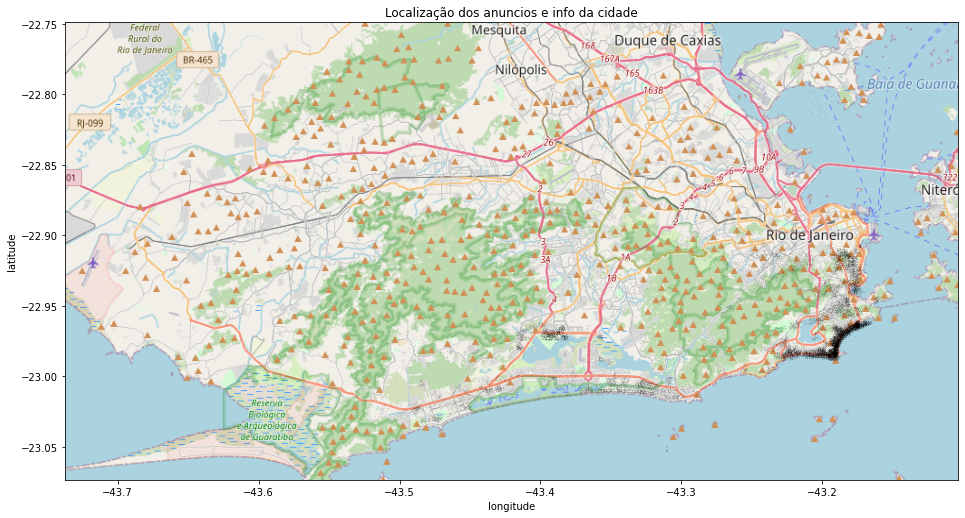

In [10]:
fig, ax= plt.subplots()
fig.set_size_inches(16,12)
a = plt.imread('map-8.png')
ax.imshow(a,zorder=0, extent=(box[0],-43.1041,-23.082,box[3]), aspect='equal')
ax.set_title('Localização dos anuncios e info da cidade')
ax.set_xlim(box[0],box[1])
ax.set_ylim(box[2],box[3])#-23.0729

_ = sns.scatterplot(x='longitude', y='latitude', data=listings, ax=ax, zorder=1,color='black',alpha=0.6, s=0.1,edgecolor=None)

# Inserindo em uma colecao

In [3]:
listings = pd.read_csv('C:/Users/rafae/Documents/Aula - PB -2022/fevereiro2020.csv')

C:\Users\rafae\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: DtypeWarning: Columns (61,62,94) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [6]:
listings.count()

id                                              36461
listing_url                                     36461
scrape_id                                       36461
last_scraped                                    36461
name                                            36403
                                                ...  
calculated_host_listings_count                  36461
calculated_host_listings_count_entire_homes     36461
calculated_host_listings_count_private_rooms    36461
calculated_host_listings_count_shared_rooms     36461
reviews_per_month                               20813
Length: 106, dtype: int64

In [ ]:
#Convertendo valor de $ price para float type

In [7]:
listings['price'] = listings['price'].replace({'\$': '', ',': ''}, regex=True).astype(float)

In [9]:
df_density_mapbox = listings.sample(n=36400)
map_center = {'lat':df_density_mapbox.latitude.mean(), 'lon':df_density_mapbox.longitude.mean()}
fig = px.density_mapbox(df_density_mapbox, lat='latitude', lon='longitude',z='price',title=10*'  '+'Daily Price density', radius=2.5,
                        center=map_center, zoom=10,
                        mapbox_style='stamen-terrain')
fig.show()

In [12]:
col_listings = db['listings']

In [31]:
#col_listings.drop()

In [14]:
listings_results = col_listings.insert_many(
    listings.to_dict(orient='records')
)

In [16]:
list(col_listings.head())

TypeError: 'Collection' object is not callable. If you meant to call the 'head' method on a 'Collection' object it is failing because no such method exists.

# Contando os documentos

In [17]:
col_listings.count_documents(filter={})

39743

# Listando todos os posts com sort

In [18]:
for post in col_listings.find().sort('number_of_reviews').limit(10):
    pprint.pprint(post)

{'_id': ObjectId('62abc812e206d6305aeddceb'),
 'access': 'Full kitchen, air conditioning, cable TV, ceiling fan, wireless '
           'internet',
 'accommodates': 2,
 'amenities': '{TV,"Cable TV",Internet,Wifi,"Air conditioning","Wheelchair '
              'accessible",Kitchen,"Paid parking off premises","Smoking '
              'allowed",Doorman,Elevator,"Buzzer/wireless '
              'intercom","Family/kid friendly","Fire '
              'extinguisher",Essentials,Shampoo,Hangers,"Hair '
              'dryer",Iron,"Laptop friendly workspace","Private '
              'entrance","High chair","Hot water","Bed linens","Extra pillows '
              'and blankets","Pocket wifi",Microwave,"Coffee '
              'maker",Refrigerator,Dishwasher,"Dishes and silverware","Cooking '
              'basics",Stove,"Luggage dropoff allowed","Long term stays '
              'allowed","Wide hallway clearance","Wide doorway","Flat path to '
              'front door","Well-lit path to entrance","Ste

# Filtrando os posts

In [25]:
for post in col_listings.find({"host_neighbourhood": "Copacabana" }).sort('number_of_reviews').limit(10):
    pprint.pprint(post)

{'_id': ObjectId('62814f211901ec63ac1f26e0'),
 'access': nan,
 'accommodates': 4,
 'amenities': '{TV,"Cable TV",Internet,Wifi,"Air '
              'conditioning",Kitchen,"Smoking allowed","Pets '
              'allowed",Doorman,Elevator,"Buzzer/wireless '
              'intercom","Family/kid friendly",Essentials,Hangers,Iron}',
 'availability_30': 1,
 'availability_365': 336,
 'availability_60': 31,
 'availability_90': 61,
 'bathrooms': 1.0,
 'bed_type': 'Pull-out Sofa',
 'bedrooms': 0.0,
 'beds': 3.0,
 'calculated_host_listings_count': 1,
 'calendar_last_scraped': '2018-04-15',
 'calendar_updated': '4 days ago',
 'cancellation_policy': 'strict',
 'city': 'Rio de Janeiro',
 'cleaning_fee': '$100.00',
 'country': 'Brazil',
 'country_code': 'BR',
 'description': 'Este apartamento tipo estúdio é o espaço ideal para 2 '
                'pessoas, mas acomoda até 4. Reformado e decorado, exatamente '
                'como nas fotos, ele tem cozinha americana com fogão cooktop a '
           

# Query agg 1

In [ ]:
%time
for post in col_listings.aggregate([{ "$group": { "_id": "$neighbourhood", "total": { "$sum": 1 } } },{ "$sort": { "total": -1 } }]):
    pprint.pprint(post)

In [ ]:
#Plano de execucao

In [13]:
cursor_one = col_listings.aggregate([{ "$group": { "_id": "$neighbourhood", "total": { "$sum": 1 } } },{ "$sort": { "total": -1 } }])

In [21]:
pipeline = [{ "$group": { "_id": "$neighbourhood", "total": { "$sum": 1 } } },{ "$sort": { "total": -1 } }]

In [22]:
db.command('aggregate', 'col_listings', pipeline=pipeline, explain=True)

{'explainVersion': '1',
 'stages': [{'$cursor': {'queryPlanner': {'namespace': 'airbnb.col_listings',
     'indexFilterSet': False,
     'parsedQuery': {},
     'maxIndexedOrSolutionsReached': False,
     'maxIndexedAndSolutionsReached': False,
     'maxScansToExplodeReached': False,
     'winningPlan': {'stage': 'EOF'},
     'rejectedPlans': []}}},
  {'$group': {'_id': '$neighbourhood', 'total': {'$sum': {'$const': 1}}}},
  {'$sort': {'sortKey': {'total': -1}}}],
 'serverInfo': {'host': 'LAPTOP-782EA3G0',
  'port': 27017,
  'version': '5.0.6',
  'gitVersion': '212a8dbb47f07427dae194a9c75baec1d81d9259'},
 'serverParameters': {'internalQueryFacetBufferSizeBytes': 104857600,
  'internalQueryFacetMaxOutputDocSizeBytes': 104857600,
  'internalLookupStageIntermediateDocumentMaxSizeBytes': 104857600,
  'internalDocumentSourceGroupMaxMemoryBytes': 104857600,
  'internalQueryMaxBlockingSortMemoryUsageBytes': 104857600,
  'internalQueryProhibitBlockingMergeOnMongoS': 0,
  'internalQueryMaxAddTo

In [15]:
plan = cursor_one.explain()
print(json.dumps(plan, indent=4))

AttributeError: 'CommandCursor' object has no attribute 'explain'

# Outro filtro

In [ ]:
for post in col_listings.find({"host_neighbourhood": "Copacabana" }).sort('number_of_reviews').limit(10):
    
    print(f'{post["host_name"]} ({post["name"]}) em {post["last_scraped"]}')
    print(f'{post["summary"]}')
    print('---')

#Detectando coding

In [ ]:
with open(file, 'rb') as rawdata:
    result = chardet.detect(rawdata.read(100000))
result

# Query Find e Sort

In [24]:
#list(db.listings.find({ "has_availability":  { "exists" : "t" } }, {"number_of_reviews":{"$gt":100}}).sort({"number_of_reviews":-1}))
list(
    db.listings.find({"number_of_reviews":{"$gt":100}}).sort("uf",-1)
    )


[{'_id': ObjectId('62814f211901ec63ac1f268d'),
  'id': 76245,
  'listing_url': 'https://www.airbnb.com/rooms/76245',
  'scrape_id': 20180414160018,
  'last_scraped': '2018-04-14',
  'name': 'Spacious Home Heart of Rio290m4QT. Discount15%week',
  'summary': nan,
  'space': 'In the period of  New Year and Carnival, the minimum time to stay is 7 days. The check in and the check out can be flexible if possible. This spacious apartment(290M2), located in the heart of Rio de Janeiro between the emblematic neighborhoods of Copacabana and Ipanema, offers the best possible location for a dream holiday in "Cidade Maravilhosa". Located in a quiet and safe street, only two blocks from Copacabana beach (3 minute walk) and three blocks from Ipanema and Leblon beaches (5 minute walk). In Copacabana there is always somewhere to eat and drink with lively streets, making this a very special neighborhood. You can easily access the apartment by foot, by car (with parking space), taxi, and several bus line

In [ ]:
# Execucao sem indices

In [36]:
cursor_one = db.listings.find({"number_of_reviews":{"$gt":100}}).sort("uf",-1)
plan = cursor_one.explain()["executionStats"]
print(json.dumps(plan, indent=4))

{
    "executionSuccess": true,
    "nReturned": 285,
    "executionTimeMillis": 61,
    "totalKeysExamined": 0,
    "totalDocsExamined": 39743,
    "executionStages": {
        "stage": "SORT",
        "nReturned": 285,
        "executionTimeMillisEstimate": 3,
        "works": 40031,
        "advanced": 285,
        "needTime": 39745,
        "needYield": 0,
        "saveState": 40,
        "restoreState": 40,
        "isEOF": 1,
        "sortPattern": {
            "uf": -1
        },
        "memLimit": 104857600,
        "type": "simple",
        "totalDataSizeSorted": 2017158,
        "usedDisk": false,
        "inputStage": {
            "stage": "COLLSCAN",
            "filter": {
                "number_of_reviews": {
                    "$gt": 100
                }
            },
            "nReturned": 285,
            "executionTimeMillisEstimate": 3,
            "works": 39745,
            "advanced": 285,
            "needTime": 39459,
            "needYield": 0,
       

In [37]:
list(db.listings.index_information())

['_id_']

In [42]:
# Criando um indice
#db.listings.create_index('cuisine')
db.listings.create_index('number_of_reviews')

'number_of_reviews_1'

In [44]:
#Consulta com indice
cursor_one = db.listings.find({"number_of_reviews":{"$gt":100}}).sort("uf",-1)
plan = cursor_one.explain()["executionStats"]
print(json.dumps(plan, indent=4))

{
    "executionSuccess": true,
    "nReturned": 285,
    "executionTimeMillis": 3,
    "totalKeysExamined": 285,
    "totalDocsExamined": 285,
    "executionStages": {
        "stage": "SORT",
        "nReturned": 285,
        "executionTimeMillisEstimate": 0,
        "works": 572,
        "advanced": 285,
        "needTime": 286,
        "needYield": 0,
        "saveState": 0,
        "restoreState": 0,
        "isEOF": 1,
        "sortPattern": {
            "uf": -1
        },
        "memLimit": 104857600,
        "type": "simple",
        "totalDataSizeSorted": 2017158,
        "usedDisk": false,
        "inputStage": {
            "stage": "FETCH",
            "nReturned": 285,
            "executionTimeMillisEstimate": 0,
            "works": 286,
            "advanced": 285,
            "needTime": 0,
            "needYield": 0,
            "saveState": 0,
            "restoreState": 0,
            "isEOF": 1,
            "docsExamined": 285,
            "alreadyHasObj": 0,
  

In [31]:
db.listings.drop_index('number_of_reviews_1')

In [32]:
db.listings.drop_index('host_neighbourhood_1')

In [45]:
list(db.listings.index_information())

['_id_', 'number_of_reviews_1', 'has_availability_1']

In [34]:
pprint(db.listings.find({"number_of_reviews":{"$gt":100}}).sort("uf",-1))

TypeError: 'module' object is not callable